In [31]:
import pandas as pd

In [32]:
wine = pd.read_csv('winequality_red.csv')

In [33]:
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [34]:
wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [35]:
wine.value_counts(subset='quality')

quality
5    681
6    638
7    199
4     53
8     18
3     10
dtype: int64

In [36]:
X = wine.drop(labels= 'quality', axis =1)
y = wine['quality']
#X = wine.drop(columns = 'quality') ---another form)

In [37]:
X.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [38]:
y.head()

0    5
1    5
2    5
3    6
4    5
Name: quality, dtype: int64

In [39]:
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [40]:
from sklearn.model_selection import train_test_split

In [41]:
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size = 0.25, random_state = 100)

In [42]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz

In [43]:
y_train

896     7
1140    6
48      5
1532    6
1223    6
       ..
53      5
350     6
79      4
792     6
1544    7
Name: quality, Length: 1199, dtype: int64

In [44]:
chart = DecisionTreeClassifier()

In [45]:
chart.fit(x_train,y_train)

DecisionTreeClassifier()

In [46]:
feature_name = list(X.columns)
class_name = list(y_train.unique())
feature_name

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol']

In [47]:
class_name

[7, 6, 5, 4, 8, 3]

In [48]:
import pydotplus
from IPython.display import Image

In [49]:
# create a dot_file which stores the tree structure

dot_data = export_graphviz(chart, feature_names = feature_name, rounded = True, filled = True)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)
graph.write_png("wineTree.png")
# Show graph
Image(graph.create_png())

In [50]:
chart.score(x_train,y_train)

1.0

In [51]:
py_pred = chart.predict(x_test)

In [52]:
# accuracy of our classification tree
chart.score(x_test,y_test)

0.585

In [53]:
from sklearn.preprocessing import StandardScaler

In [54]:
scaler = StandardScaler()
x_transform = scaler.fit_transform(X)

In [55]:
x_transform

array([[-0.52835961,  0.96187667, -1.39147228, ...,  1.28864292,
        -0.57920652, -0.96024611],
       [-0.29854743,  1.96744245, -1.39147228, ..., -0.7199333 ,
         0.1289504 , -0.58477711],
       [-0.29854743,  1.29706527, -1.18607043, ..., -0.33117661,
        -0.04808883, -0.58477711],
       ...,
       [-1.1603431 , -0.09955388, -0.72391627, ...,  0.70550789,
         0.54204194,  0.54162988],
       [-1.39015528,  0.65462046, -0.77526673, ...,  1.6773996 ,
         0.30598963, -0.20930812],
       [-1.33270223, -1.21684919,  1.02199944, ...,  0.51112954,
         0.01092425,  0.54162988]])

In [56]:
from sklearn.decomposition import PCA
import numpy as np
pca = PCA()

In [57]:
import matplotlib.pyplot as plt

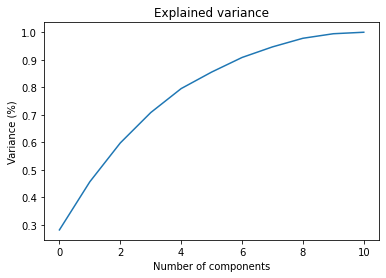

In [62]:
principalComponents = pca.fit_transform(x_transform)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Variance (%)') #for each component
plt.title('Explained variance')
plt.show()

In [63]:
pca = PCA(n_components = 8)
new_x = pca.fit_transform(x_transform)

new_x_df = pd.DataFrame(new_x, columns = ['x1','x2','x3','x4','x5','x6','x7','x8'])

In [64]:
new_x_df

,x1,x2,x3,x4,x5,x6,x7,x8
0,-1.619530,0.450950,-1.774454,0.043740,0.067014,-0.913921,-0.161043,-0.282258
1,-0.799170,1.856553,-0.911690,0.548066,-0.018392,0.929714,-1.009829,0.762587
2,-0.748479,0.882039,-1.171394,0.411021,-0.043531,0.401473,-0.539553,0.597946
3,2.357673,-0.269976,0.243489,-0.928450,-1.499149,-0.131017,0.344290,-0.455375
4,-1.619530,0.450950,-1.774454,0.043740,0.067014,-0.913921,-0.161043,-0.282258
...,...,...,...,...,...,...,...,...
1594,-2.150500,0.814286,0.617063,0.407687,-0.240936,0.054835,0.170812,-0.355866
1595,-2.214496,0.893101,1.807402,0.414003,0.119592,-0.674711,-0.607970,-0.247640
1596,-1.456129,0.311746,1.124239,0.491877,0.193716,-0.506410,-0.231082,0.079382
1597,-2.270518,0.979791,0.627965,0.639770,0.067735,-0.860408,-0.321487,-0.468876


In [103]:
x_train,x_test,y_train,y_test = train_test_split(new_x_df,y,test_size = 0.3,random_state = 30)
chart1 = DecisionTreeClassifier()
chart1.fit(x_train, y_train)
chart1.score(x_test,y_test)

0.56875

In [77]:
from sklearn.model_selection import GridSearchCV

In [66]:
#Hyper parameter tuning

grid_param = {
    'criterion': ['gini','entropy'],
    'max_depth': range(2,33,1),
    'min_samples_leaf': range(1,10,1),
    'min_samples_split': range(2,10,1),
    'splitter': ['best','random']
    
}

In [82]:
grid_search = GridSearchCV(estimator = chart1,
                          param_grid = grid_param,
                          cv = 5, n_jobs= -1)

In [83]:
grid_search.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 33),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [84]:
best_parameters = grid_search.best_params_
print(best_parameters)

{'criterion': 'gini', 'max_depth': 23, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}


In [86]:
grid_search.best_score_

0.6005565342729019

In [108]:
chart2 = DecisionTreeClassifier(criterion='gini', max_depth= 23, min_samples_leaf=1, min_samples_split=2, splitter= 'best')
chart2.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=23)

In [109]:
chart2.score(x_test,y_test)

0.5770833333333333

In [110]:
X.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [111]:
y_train.unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [113]:
# create a dot_file which stores the tree structure
dot_data = export_graphviz(chart2, rounded = True, filled = True)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())